In [1]:

# import data processing and visualisation libraries
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd

# import image processing libraries
import cv2
from PIL import Image

# import tensorflow and keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array,load_img
from tensorflow.keras.utils import to_categorical
import tensorflow as tf
import os
import random

#import from sklearn
from sklearn.model_selection import train_test_split

2025-10-01 12:18:43.937389: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1759321124.186133    1236 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1759321124.252860    1236 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
DATA_DIR = "/kaggle/input/asl-dataset/asl_sample_train1"

In [3]:
print(os.listdir(DATA_DIR)[:])

['N', 'R', 'space', 'B', 'I', 'del', 'F', 'H', 'E', 'U', 'M', 'X', 'K', 'Q', 'Y', 'S', 'G', 'A', 'O', 'T', 'V', 'Z', 'C', 'P', 'L', 'W', 'D', 'nothing', 'J']


In [4]:
def check_corruption(Training_data=DATA_DIR ):
    corrupted_images = []
    extentions = []
    
    sample_images = []
    
    num_samples_per_class = 1  # عدد الصور لكل class
    
    for class_name in os.listdir(Training_data):
        class_path = os.path.join(Training_data, class_name)
        if not os.path.isdir(class_path):
            continue
    
        class_imgs = []
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)
            root, extention = os.path.splitext(img_path)
            if extention not in extentions:
                extentions.append(extention)
            
            try:
                if os.path.isfile(img_path) and img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img = Image.open(img_path)
                    img.verify()
                    class_imgs.append(img_path)
            except Exception as es:
                corrupted_images.append(img_path)
                print(f"corrupted image path: {img_path}")
    
        # اختيار أكثر من صورة لكل class
        if class_imgs:
            sample_images.extend(random.sample(class_imgs, min(num_samples_per_class, len(class_imgs))))
    
    print(f"Number of corrupted images: {len(corrupted_images)}")
    print(f"Extensions found: {extentions}")

In [5]:
check_corruption()

Number of corrupted images: 0
Extensions found: ['.jpg', '.jpeg']


In [6]:
categories={0:'A',
           1:'B',
           2:'C',
           3:'D',
           4:'E',
            5:'F',
            6:'G',
            7:'H',
            8:'I',
            9:'J',
            10:'K',
            11:'L',
            12:'M',
            13:'N',
            14:'O',
            15:'P',
            16:'Q', 
            17:'R',
            18:'S',
            19:'T',
            20:'U',
            21:'V',
            22:'W',
            23:'X',
            24:'Y',
            25:'Z',
            26:'del',
            27:'nothing',
            28:'space'
           
           }

In [7]:
#function to store the image with the full path for easy reaching it during the training  
def add_classNames_prefix(df, col_name, base_path):
    df[col_name] = df.apply(lambda x: os.path.join(base_path, categories[x["Category"]], x["FileName"]), axis=1)
    return df
#list to lis the image name 
file_names_list=[]
#list to list the category of each image 
categories_list=[]

for category in categories:
    filenames=os.listdir(os.path.join(DATA_DIR,categories[category]))
    file_names_list+=filenames
    categories_list+=[category]*len(filenames)

df=pd.DataFrame({"FileName":file_names_list,"Category":categories_list})
df=add_classNames_prefix(df,"FileName",DATA_DIR)
#shuffle the images in the data frame for good training   
df = df.sample(frac=1).reset_index(drop=True)

In [8]:
df

,FileName,Category
0,/kaggle/input/asl-dataset/asl_sample_train1/R/...,17
1,/kaggle/input/asl-dataset/asl_sample_train1/I/...,8
2,/kaggle/input/asl-dataset/asl_sample_train1/N/...,13
3,/kaggle/input/asl-dataset/asl_sample_train1/E/...,4
4,/kaggle/input/asl-dataset/asl_sample_train1/E/...,4
...,...,...
28995,/kaggle/input/asl-dataset/asl_sample_train1/no...,27
28996,/kaggle/input/asl-dataset/asl_sample_train1/B/...,1
28997,/kaggle/input/asl-dataset/asl_sample_train1/S/...,18
28998,/kaggle/input/asl-dataset/asl_sample_train1/B/...,1


In [9]:
categories[df.Category[1]]

'I'

In [10]:
df.FileName[1]

'/kaggle/input/asl-dataset/asl_sample_train1/I/I (2212).jpg'

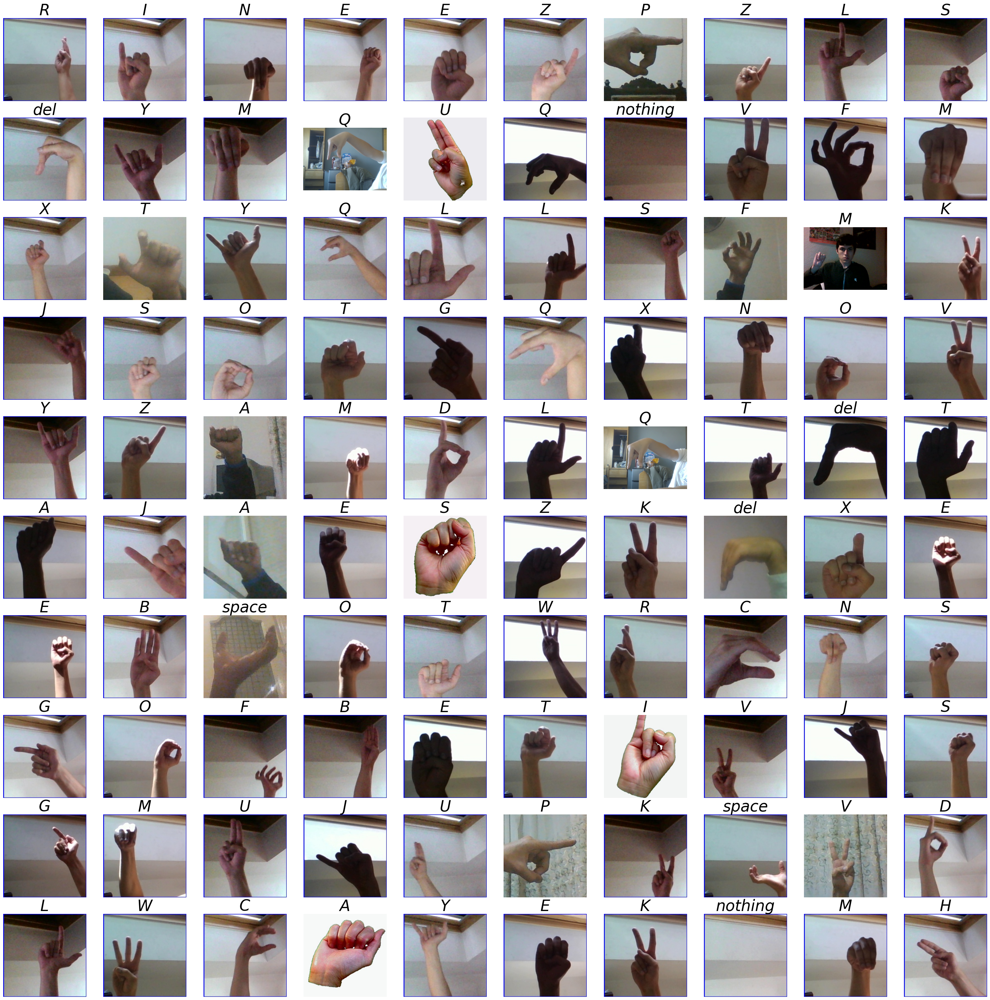

In [11]:
plt.figure(figsize=(40,40))
for i in range(100):
    path=df.FileName[i]
    img=plt.imread(path)
    plt.subplot(10,10,i+1)
    plt.imshow(img)
    plt.title(categories[df.Category[i]],fontsize=35,fontstyle='italic')
    plt.axis("off")

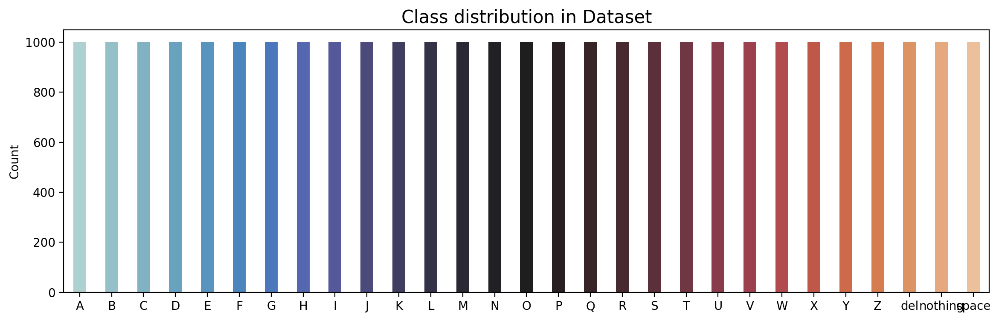

In [12]:
label,count = np.unique(df.Category,return_counts=True)
uni = pd.DataFrame(data=count,index=categories.values(),columns=['Count'])

plt.figure(figsize=(14,4),dpi=200)
sns.barplot(data=uni,x=uni.index,y='Count',palette='icefire',width=0.4).set_title('Class distribution in Dataset',fontsize=15)
plt.show()

In [13]:
img_shapes = []

for path in df["FileName"]:  
    img = cv2.imread(path)    
    if img is not None:       
        img_shapes.append(img.shape)  

print(set(img_shapes)) 


{(400, 400, 3), (200, 200, 3), (480, 640, 3), (1920, 1920, 3), (720, 1280, 3)}


In [14]:
def load_data_from_df(df, img_size=128, grayscale=False):
    data = []
    labels = []

    classes = sorted(df["Category"].unique())
    class_to_index = {cls: idx for idx, cls in enumerate(classes)}

    for _, row in df.iterrows():
        try:
            if grayscale:
                img = cv2.imread(row["FileName"], cv2.IMREAD_GRAYSCALE)
                img = cv2.resize(img, (img_size, img_size))
                img = img / 255.0
                img = np.expand_dims(img, axis=-1)
            else:
                img = cv2.imread(row["FileName"])
                img = cv2.resize(img, (img_size, img_size))
                img = img / 255.0

            data.append(img)
            labels.append(class_to_index[row["Category"]])
        except:
            pass
    
    return np.array(data, dtype="float32"), np.array(labels), classes


In [15]:
#calling functionAC
data, labels, classes=load_data_from_df(df)

In [16]:
#shape of the all images after the convertion into matrix
data.shape

(29000, 128, 128, 3)

In [17]:
data

array([[[[0.9843137 , 0.01176471, 0.        ],
         [0.91764706, 0.01568628, 0.00784314],
         [0.9019608 , 0.01176471, 0.01960784],
         ...,
         [0.89411765, 0.00784314, 0.02352941],
         [0.90588236, 0.00392157, 0.03529412],
         [0.9372549 , 0.00784314, 0.01176471]],

        [[0.92941177, 0.00784314, 0.01960784],
         [0.81960785, 0.2627451 , 0.25882354],
         [0.68235296, 0.34117648, 0.3372549 ],
         ...,
         [0.58431375, 0.2509804 , 0.29411766],
         [0.654902  , 0.23921569, 0.28627452],
         [0.7294118 , 0.08235294, 0.11372549]],

        [[0.90588236, 0.00784314, 0.03137255],
         [0.6901961 , 0.3529412 , 0.3372549 ],
         [0.45882353, 0.44705883, 0.41568628],
         ...,
         [0.27450982, 0.25882354, 0.3137255 ],
         [0.37254903, 0.2509804 , 0.3019608 ],
         [0.56078434, 0.10196079, 0.13333334]],

        ...,

        [[0.91764706, 0.00784314, 0.01960784],
         [0.45490196, 0.09411765, 0.09803922]

In [18]:
#the output labels are 29 class
labels

array([17,  8, 13, ..., 18,  1, 13])

In [19]:
classes

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28]

TypeError: only integer scalar arrays can be converted to a scalar index

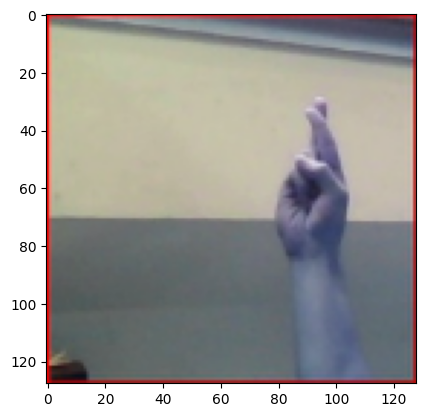

In [20]:
plt.imshow(data[0].squeeze(), cmap="gray")  
plt.title(f"Label: {classes[data[0]]}")   
plt.axis("off") 
plt.show()


In [21]:
Y = to_categorical(labels, num_classes=len(classes))

In [22]:
Y

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [23]:
Y.shape

(29000, 29)

In [24]:
X_train,X_temp,y_train,y_temp=train_test_split(data,Y,test_size=0.3,random_state=42)
X_val,X_test,y_val,y_test=train_test_split(X_temp,y_temp,test_size=0.5,random_state=42)

In [25]:
X_train.shape

(20300, 128, 128, 3)

In [26]:
X_test.shape

(4350, 128, 128, 3)

In [28]:
# Checking the dimensions of all the variables
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)
print(X_test.shape)
print(y_test.shape)


(20300, 128, 128, 3)
(20300, 29)
(4350, 128, 128, 3)
(4350, 29)
(4350, 128, 128, 3)
(4350, 29)


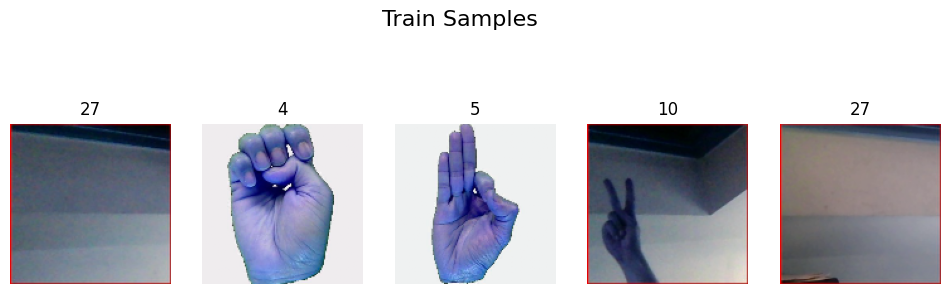

In [29]:
def show_samples(X, y, classes, n=5, title="Samples"):
    plt.figure(figsize=(12, 4))
    for i in range(n):
        plt.subplot(1, n, i+1)
        plt.imshow(X[i].squeeze(), cmap="gray")  # squeeze() لو الصور grayscale
        # Decode the one-hot encoded label back to an integer index
        class_index = np.argmax(y[i])
        plt.title(classes[class_index])
        plt.axis("off")
    plt.suptitle(title, fontsize=16)
    plt.show()

# عرض عينات من Train
show_samples(X_train, y_train, classes, n=5, title="Train Samples")

In [45]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam


base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(128,128,3))

for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
output = Dense(len(classes), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

model.compile(optimizer=Adam(learning_rate=1e-3),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 64, 64,    │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 64, 64,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 64, 64,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 64, 64,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 64, 64,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 64, 64,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 64, 64,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 64, 64,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 65, 65,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 32, 32,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 32, 32,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 32, 32,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 32, 32,    │      2,304 │ block_1_depthwis

 Total params: 2,928,733 (11.17 MB)

 Trainable params: 670,749 (2.56 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [46]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator()
val_datagen = ImageDataGenerator()


In [47]:
from tensorflow.keras.callbacks import EarlyStopping

# EarlyStopping callback
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=2,                
    restore_best_weights=True, 
    verbose=1
)

In [53]:
history = model.fit(
    train_datagen.flow(X_train, y_train, batch_size=32),
    validation_data=val_datagen.flow(X_val, y_val),
    epochs=10,
    callbacks=[early_stop]
)


Epoch 1/10
635/635 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - accuracy: 0.9891 - loss: 0.0387 - val_accuracy: 0.9264 - val_loss: 0.2961
Epoch 2/10
635/635 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step - accuracy: 0.9878 - loss: 0.0388 - val_accuracy: 0.9499 - val_loss: 0.1982
Epoch 3/10
635/635 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - accuracy: 0.9934 - loss: 0.0212 - val_accuracy: 0.9402 - val_loss: 0.2723
Epoch 4/10
635/635 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - accuracy: 0.9847 - loss: 0.0434 - val_accuracy: 0.9483 - val_loss: 0.2274
Epoch 4: early stopping
Restoring model weights from the end of the best epoch: 2.


In [54]:
# Evaluate on test data
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=1)

print(" Test Accuracy:", test_acc)
print(" Test Loss:", test_loss)


136/136 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.9614 - loss: 0.1635
 Test Accuracy: 0.95333331823349
 Test Loss: 0.19315315783023834
